# Step 1 - Lets start with the imports

In [ ]:
# Import necessary libraries

import numpy as np  # Numerical operations library
import pandas as pd  # Data manipulation library
import os  # Operating system functions
import cv2 as cv  # OpenCV for computer vision tasks
import matplotlib.pyplot as plt  # Plotting library
import matplotlib.patches as patches  # For drawing rectangles in plots
from glob import glob  # File path pattern matching
from tqdm.notebook import tqdm  # Progress bar for loops
tqdm.pandas()  # Enable progress bar for pandas operations
import random  # Random number generation
import json  # JSON (JavaScript Object Notation) data format
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets
import shutil  # File operations library
import yaml  # YAML (YAML Ain't Markup Language) configuration file format

# Set the style for matplotlib plots
plt.style.use("ggplot")  # Use the "ggplot" style for better visualization aesthetics


In [ ]:
# Import the drive module from the google.colab library
from google.colab import drive

# Mount the Google Drive to the Colab environment
drive.mount("/content/drive")


Mounted at /content/drive




# STEP 2 - Converting annotation into a DataFrame

In [ ]:
# Define the base directory path for the dataset
BASE_DIR = "/kaggle/input/arthropod-taxonomy-orders-object-detection-dataset"

# Use the glob function to create a list of file paths matching the specified pattern
# (This pattern searches for JSON files in the 'annotations' directory within each subdirectory )
annotation_list = glob("/kaggle/input/arthropod-taxonomy-orders-object-detection-dataset/ArTaxOr/*/annotations/*.json")


In [ ]:
# Create an empty DataFrame named 'data'
data = pd.DataFrame()

# Add a column named 'annotation_dir' to the DataFrame and assign it the values from the 'annotation_list'
# (Each value in 'annotation_list' corresponds to a file path of a JSON file in the 'annotations' directory)
data["annotation_dir"] = annotation_list


In [ ]:
def read_json_data(jsonfile):
    # Initialize an empty dictionary to store data for each region
    rows = {"img_dir": [], "img_w": [], "img_h": [], "sp_type": [], "xc": [], "yc": [], "bb_height": [], "bb_width": [], "bb_left": [], "bb_top": []}

    # Open and load the JSON file
    json_f = open(jsonfile)
    json_f = json.load(json_f)

    # Iterate over each region in the JSON file
    for region in json_f["regions"]:
        # Extract information from the JSON file
        img_dir = json_f["asset"]["path"][7:]  # Extracting image directory path

        sp_type = region["tags"][0]  # Extracting species type

        img_w = json_f["asset"]["size"]["width"]  # Extracting image width
        img_h = json_f["asset"]["size"]["height"]  # Extracting image height

        # Normalize Bounding Box
        bb_height = region["boundingBox"]["height"] / img_h  # Normalized bounding box height
        bb_width = region["boundingBox"]["width"] / img_w  # Normalized bounding box width

        bb_left = region["boundingBox"]["left"] / img_w  # Normalized bounding box left coordinate
        bb_top = region["boundingBox"]["top"] / img_h  # Normalized bounding box top coordinate

        xcenter = region['boundingBox']['left'] / img_w + 0.5 * bb_width  # X-coordinate of the bounding box center
        ycenter = region['boundingBox']['top'] / img_h + 0.5 * bb_height  # Y-coordinate of the bounding box center

        # Append extracted values to the dictionary
        rows["img_dir"].append(BASE_DIR + img_dir)
        rows["sp_type"].append(sp_type)
        rows["img_w"].append(img_w)
        rows["img_h"].append(img_h)
        rows["bb_height"].append(bb_height)
        rows["bb_width"].append(bb_width)
        rows["bb_left"].append(bb_left)
        rows["bb_top"].append(bb_top)
        rows["xc"].append(xcenter)
        rows["yc"].append(ycenter)

    # Return the dictionary containing the extracted data for each region
    return rows


In [ ]:
# Create an empty DataFrame
df = pd.DataFrame()

# Print the empty DataFrame
print(df)

Empty DataFrame
Columns: []
Index: []


In [ ]:
# Iterate over each JSON file path in the 'annotation_dir' column of the 'data' DataFrame
for json_file in tqdm(data["annotation_dir"]):
    # Read data from the current JSON file
    rows = read_json_data(json_file)

    # Append the data to the DataFrame
    df = df.append(pd.DataFrame.from_dict(rows), ignore_index=True)


  0%|          | 0/15376 [00:00<?, ?it/s]

In [ ]:
# Reset the index of the DataFrame 'df' and drop the old index
df = df.reset_index(drop=True)


In [ ]:
df.head() # lets view the data now

,img_dir,img_w,img_h,sp_type,xc,yc,bb_height,bb_width,bb_left,bb_top
0,/kaggle/input/arthropod-taxonomy-orders-object...,3486,2324,Coleoptera,0.550999,0.344542,0.288521,0.236389,0.432805,0.200281
1,/kaggle/input/arthropod-taxonomy-orders-object...,2848,2136,Coleoptera,0.216954,0.222222,0.262452,0.187500,0.123204,0.090996
2,/kaggle/input/arthropod-taxonomy-orders-object...,2848,2136,Coleoptera,0.767241,0.096743,0.157088,0.078305,0.728089,0.018199
3,/kaggle/input/arthropod-taxonomy-orders-object...,2848,2136,Coleoptera,0.211566,0.722701,0.257663,0.114943,0.154095,0.593870
4,/kaggle/input/arthropod-taxonomy-orders-object...,2848,2136,Coleoptera,0.451868,0.476533,0.456897,0.272270,0.315733,0.248084


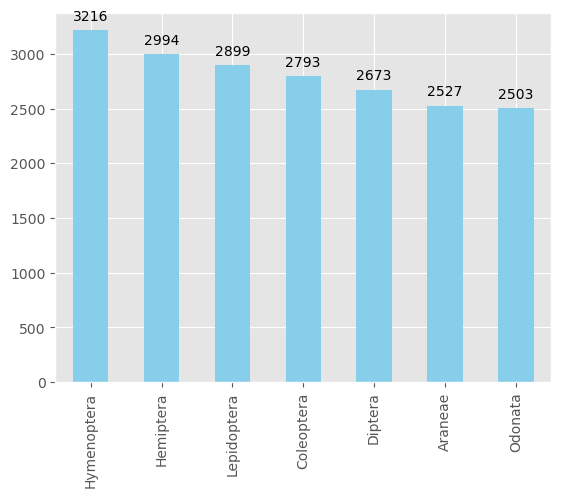

In [ ]:
# Plot a bar chart of the value counts for the 'sp_type' column in the DataFrame 'df' with counts on top
ax = df.sp_type.value_counts().plot(kind='bar', color='skyblue')

# Display counts on top of each bar
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

# Show the plot
plt.show()


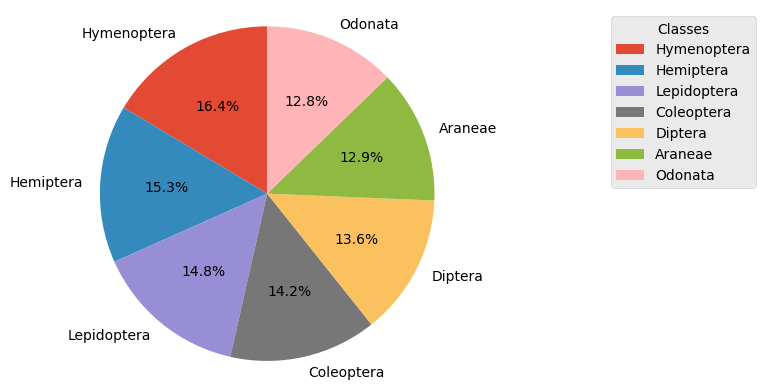

In [ ]:
import matplotlib.pyplot as plt

# Your data
classes_name = ["Hymenoptera", "Hemiptera", "Lepidoptera", "Coleoptera", "Diptera", "Araneae", "Odonata"]
classes_num = [0, 1, 2, 3, 4, 5, 6]
data_counts = df.sp_type.value_counts()

# Plot a pie chart with a legend
plt.pie(data_counts, labels=classes_name, autopct='%1.1f%%', startangle=90)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

# Add a legend
plt.legend(title="Classes", loc="upper right", bbox_to_anchor=(1.5, 1))

# Show the plot
plt.show()


# STEP 3 - Display Some examples

In [ ]:
def display_random_imgs(df, rows, cols):
    # Randomly sample indices from the DataFrame
    idxs = random.sample(df.index.tolist(), rows * cols)

    # Create a subplot with the specified number of rows and columns
    fig, ax = plt.subplots(rows, cols, figsize=(10, 10))

    # Check if there is more than one subplot
    if rows * cols != 1:
        # Iterate through each subplot
        for count, axs in enumerate(ax.flatten()):
            # Get the image path and create a rectangle patch based on bounding box information
            path = df.img_dir.iloc[idxs[count]]
            patch = patches.Rectangle((df.bb_left.iloc[idxs[count]] * df.img_w.iloc[idxs[count]],
                                       df.bb_top.iloc[idxs[count]] * df.img_h.iloc[idxs[count]]),
                                      df.bb_width.iloc[idxs[count]] * df.img_w.iloc[idxs[count]],
                                      df.bb_height.iloc[idxs[count]] * df.img_h.iloc[idxs[count]],
                                      linewidth=1, edgecolor='r', facecolor='none')

            # Read the image and display it with the bounding box patch
            img = plt.imread(path)
            axs.imshow(img)
            axs.add_patch(patch)
            axs.axis('off')
            axs.title.set_text(df.sp_type.iloc[idxs[count]])
    else:
        # If there's only one subplot, display the image without creating subplots
        path = df.img_dir.iloc[idxs[0]]
        patch = patches.Rectangle((df.bb_left.iloc[idxs[0]] * df.img_w.iloc[idxs[0]],
                                   df.bb_top.iloc[idxs[0]] * df.img_h.iloc[idxs[0]]),
                                  df.bb_width.iloc[idxs[0]] * df.img_w.iloc[idxs[0]],
                                  df.bb_height.iloc[idxs[0]] * df.img_h.iloc[idxs[0]],
                                  linewidth=1, edgecolor='r', facecolor='none')

        img = plt.imread(path)
        ax.imshow(img)
        ax.add_patch(patch)
        ax.axis('off')
        ax.title.set_text(df.sp_type.iloc[idxs[0]])


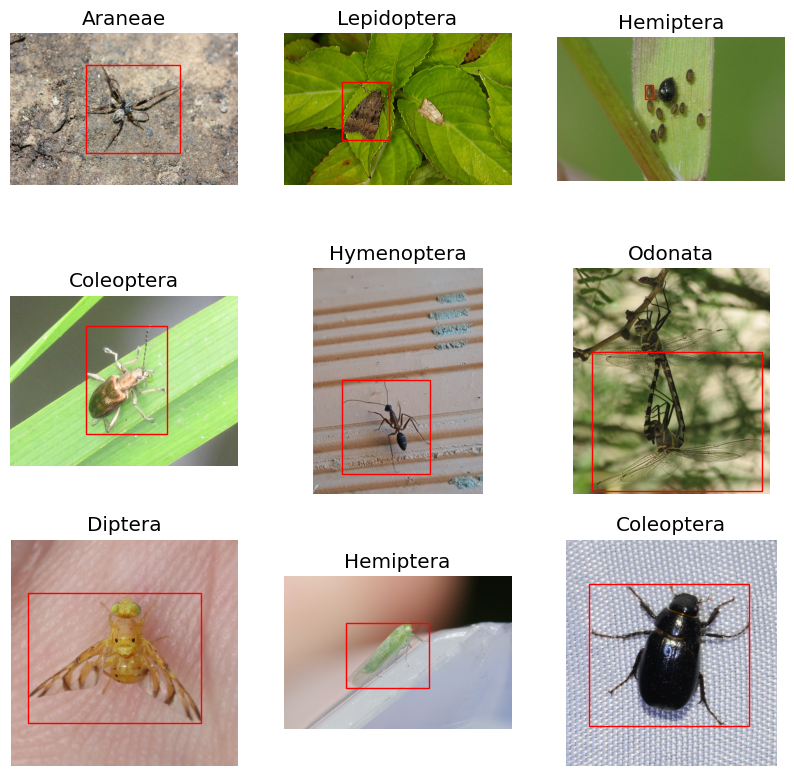

In [ ]:
display_random_imgs(df ,3, 3) # Show the plot

In [ ]:
# Define the class names and their corresponding numerical labels
classes_name = ["Hymenoptera", "Hemiptera", "Lepidoptera", "Coleoptera", "Diptera", "Araneae", "Odonata"]
classes_num = [0, 1, 2, 3, 4, 5, 6]

# Replace class names in the 'sp_type' column with their numerical labels
df.sp_type = df.sp_type.replace(classes_name, classes_num)


**We are splitting the dataset into 3 parts -**

train dataset - the model will be trained on this

val dataset - the unseen dataset on which the model will be tested / validated

test dataset - completely unseen dataset on which we will just look at the predictions

In [ ]:
# Split the DataFrame into training, validation, and testing sets
train, val_test = train_test_split(df, test_size=0.3, random_state=42)
val, test = train_test_split(val_test, test_size=0.5, random_state=42)

In [ ]:
# Create a directory named 'data'
!mkdir data

# Create directories for training, validation, and testing data
!mkdir data/train
!mkdir data/val
!mkdir data/test

mkdir: cannot create directory ‘data’: File exists
mkdir: cannot create directory ‘data/train’: File exists
mkdir: cannot create directory ‘data/val’: File exists
mkdir: cannot create directory ‘data/test’: File exists


In [ ]:
def add_data_to_folder(file_type, data):
    # Iterate over rows in the DataFrame
    for index, row in tqdm(data.iterrows(), total=len(data)):
        # Copy the image file to the specified folder
        shutil.copy(row["img_dir"], f"/kaggle/working/data/{file_type}")

        # Create a text file and write the bounding box and class information
        with open(f'/kaggle/working/data/{file_type}/{row.img_dir.split("/")[-1][:-4]}.txt', "w") as f:
            # Write class label, x-center, y-center, bounding box width, and bounding box height to the text file
            f.write(str(row["sp_type"]))
            f.write(" ")
            f.write(str(row["xc"]))
            f.write(" ")
            f.write(str(row["yc"]))
            f.write(" ")
            f.write(str(row["bb_width"]))
            f.write(" ")
            f.write(str(row["bb_height"]))
            f.write("\n")
            # Close the file
            f.close()


In [ ]:
# Add training data to the 'train' folder
add_data_to_folder("train", train)

# Add validation data to the 'val' folder
add_data_to_folder("val", val)

# Add testing data to the 'test' folder
add_data_to_folder("test", test)

  0%|          | 0/13723 [00:00<?, ?it/s]

  0%|          | 0/2941 [00:00<?, ?it/s]

  0%|          | 0/2941 [00:00<?, ?it/s]

In [ ]:

# Check the number of images in the training folder
train_image_count = len(os.listdir('/kaggle/working/data/train'))
print(f"Number of images in the training folder: {train_image_count}")

# Check the number of images in the validation folder
val_image_count = len(os.listdir('/kaggle/working/data/val'))
print(f"Number of images in the validation folder: {val_image_count}")

# Check the number of images in the testing folder
test_image_count = len(os.listdir('/kaggle/working/data/test'))
print(f"Number of images in the testing folder: {test_image_count}")



Number of images in the training folder: 22392
Number of images in the validation folder: 5358
Number of images in the testing folder: 5332


In [ ]:
# Update the YAML file with paths for training, validation, and testing data
yaml_dict = dict(
    train='/kaggle/working/data/train',  # Path to the training data folder
    val='/kaggle/working/data/val',      # Path to the validation data folder
    test='/kaggle/working/data/test',    # Path to the testing data folder
    nc=len(classes_num),                 # Number of classes
    names=classes_name                   # Class names
)

with open('/kaggle/working/data.yaml', 'w') as outfile:
    yaml.dump(yaml_dict, outfile, default_flow_style=False)

# Display the contents of the created YAML file
%cat /kaggle/working/data.yaml


names:
- Hymenoptera
- Hemiptera
- Lepidoptera
- Coleoptera
- Diptera
- Araneae
- Odonata
nc: 7
test: /kaggle/working/data/test
train: /kaggle/working/data/train
val: /kaggle/working/data/val




# STEP 4 - Train the Yolo v8 Model

In [ ]:
! pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 659.4/659.4 kB 8.3 MB/s eta 0:00:00


In [ ]:
# Import ultralytics and clear IPython display, then run YOLOv8 checks to verify installation and dependencies
import ultralytics
from IPython import display
display.clear_output()
!yolo checks


Ultralytics YOLOv8.0.223 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.9/78.2 GB disk)

OS                  Linux-5.15.120+-x86_64-with-glibc2.35
Environment         Colab
Python              3.10.12
Install             pip
RAM                 12.68 GB
CPU                 Intel Xeon 2.00GHz
CUDA                11.8

matplotlib          ✅ 3.7.1>=3.3.0
numpy               ✅ 1.23.5>=1.22.2
opencv-python       ✅ 4.8.0.76>=4.6.0
pillow              ✅ 9.4.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.11.4>=1.4.1
torch               ✅ 2.1.0+cu118>=1.8.0
torchvision         ✅ 0.16.0+cu118>=0.9.0
tqdm                ✅ 4.66.1>=4.64.0
pandas              ✅ 1.5.3>=1.1.4
seaborn             ✅ 0.12.2>=0.11.0
psutil              ✅ 5.9.5
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("yolov8s.pt")  # load a pretrained model (recommended for training)
batch_size = 8
imgsz = 640

In [ ]:
del df , data

In [ ]:
# Use the model
model.train(data="data.yaml", epochs=10 , batch = batch_size , imgsz=imgsz)  # train the model

New https://pypi.org/project/ultralytics/8.0.222 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.0.145 🚀 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla T4, 15110MiB)
WARNING ⚠️ Upgrade to torch>=2.0.0 for deterministic training.
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=data.yaml, epochs=10, patience=50, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, vid_stride=1, line_width=None, visualize=False, augment=Fals

  0%|          | 0.00/755k [00:00<?, ?B/s]

Overriding model.yaml nc=80 with nc=7

                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


  0%|          | 0.00/6.23M [00:00<?, ?B/s]

AMP: checks passed ✅
train: Scanning /kaggle/working/data/train... 11196 images, 0 backgrounds, 0 corrupt: 100%|██████████| 11196/11196 [00:17<00:00, 634.88it/s]
train: New cache created: /kaggle/working/data/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: Scanning /kaggle/working/data/val... 2679 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2679/2679 [00:02<00:00, 932.99it/s]
val: New cache created: /kaggle/working/data/val.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: AdamW(lr=0.000909, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), 

# Step 5 - So we will now validate the model on our unseen validation dataset

In [ ]:
# Validate the model
metrics = model.val()  # no arguments needed, dataset and settings remembered
metrics.box.map    # map50-95
metrics.box.map50  # map50
metrics.box.map75  # map75
metrics.box.maps   # a list contains map50-95 of each category

Ultralytics YOLOv8.0.145 🚀 Python-3.7.12 torch-1.13.0 CUDA:0 (Tesla T4, 15110MiB)
val: Scanning /kaggle/working/data/val.cache... 2679 images, 0 backgrounds, 0 corrupt: 100%|██████████| 2679/2679 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 335/335 [02:43<00:00,  2.05it/s]
                   all       2679       2679        0.7      0.693      0.723      0.601
           Hymenoptera       2679        397      0.627      0.514      0.551      0.439
             Hemiptera       2679        418      0.689      0.718      0.756      0.653
           Lepidoptera       2679        400      0.583      0.743      0.654      0.524
            Coleoptera       2679        376      0.719      0.606       0.69      0.561
               Diptera       2679        348      0.624      0.615      0.668      0.554
               Araneae       2679        372      0.841      0.739       0.82      0.682
               Odonata  

array([     0.4386,     0.65281,     0.52379,     0.56091,     0.55446,     0.68241,     0.79486])

In [ ]:
path = model.export(format='onnx')  # export the model to ONNX format

Ultralytics YOLOv8.0.145 🚀 Python-3.7.12 torch-1.13.0 CPU (Intel Xeon 2.00GHz)

PyTorch: starting from 'runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 11, 8400) (21.4 MB)

ONNX: starting export with onnx 1.13.1 opset 16...
ONNX: export success ✅ 1.8s, saved as 'runs/detect/train/weights/best.onnx' (42.7 MB)

Export complete (4.1s)
Results saved to /kaggle/working/runs/detect/train/weights
Predict:         yolo predict task=detect model=runs/detect/train/weights/best.onnx imgsz=640 
Validate:        yolo val task=detect model=runs/detect/train/weights/best.onnx imgsz=640 data=None 
Visualize:       https://netron.app


In [ ]:
import shutil
shutil.make_archive("/kaggle/working/runs", 'zip', "/kaggle/working/runs")


In [ ]:
import shutil
shutil.make_archive("/kaggle/working/data", 'zip', "/kaggle/working/data")

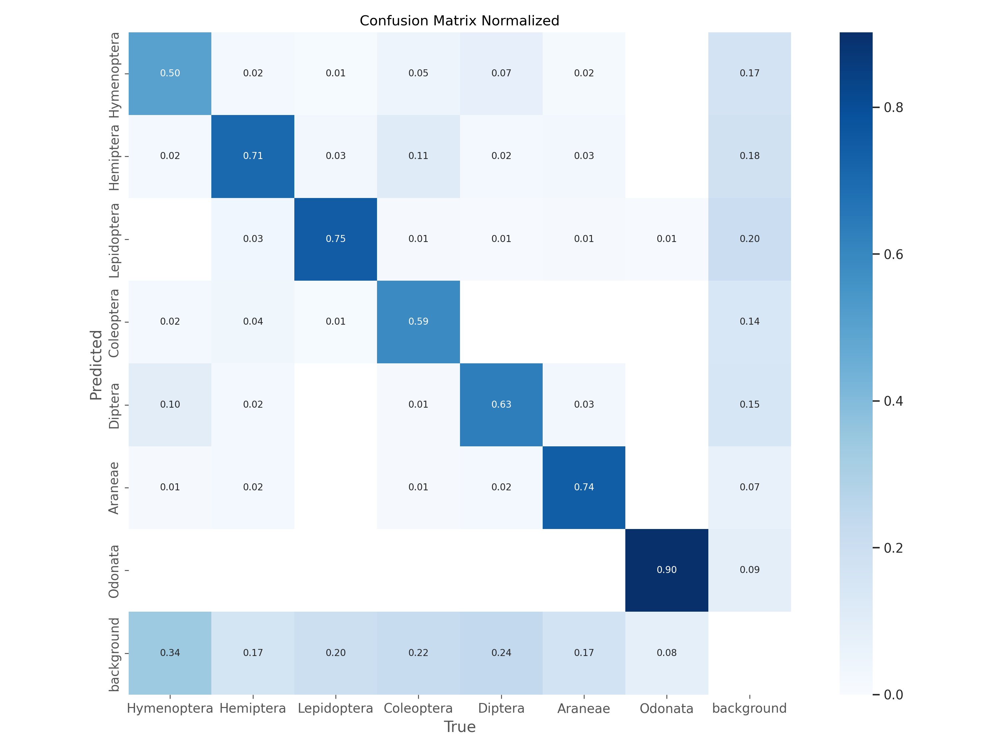

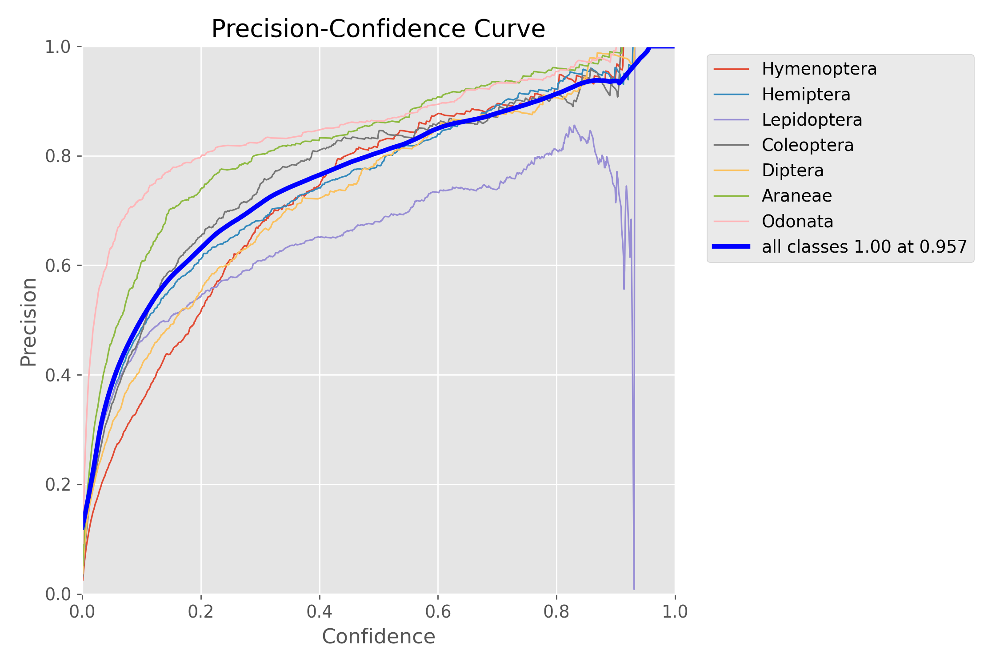

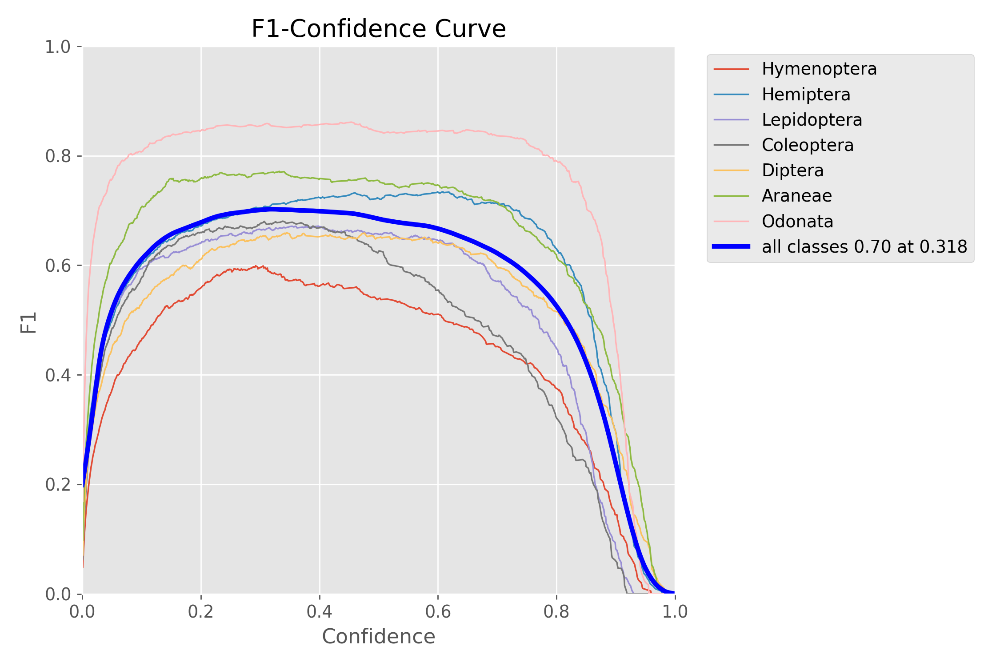

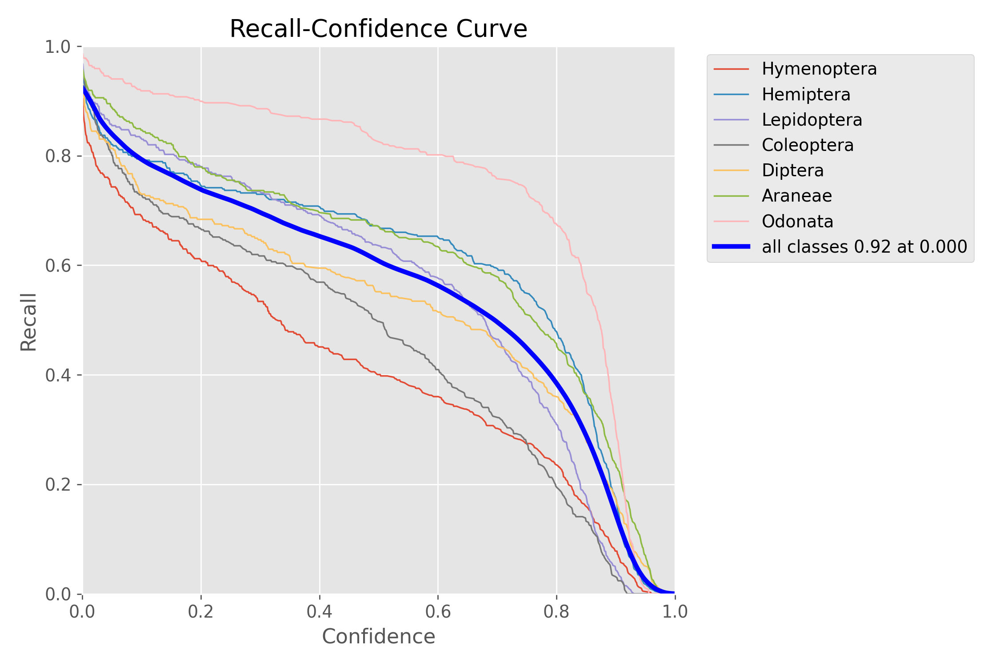

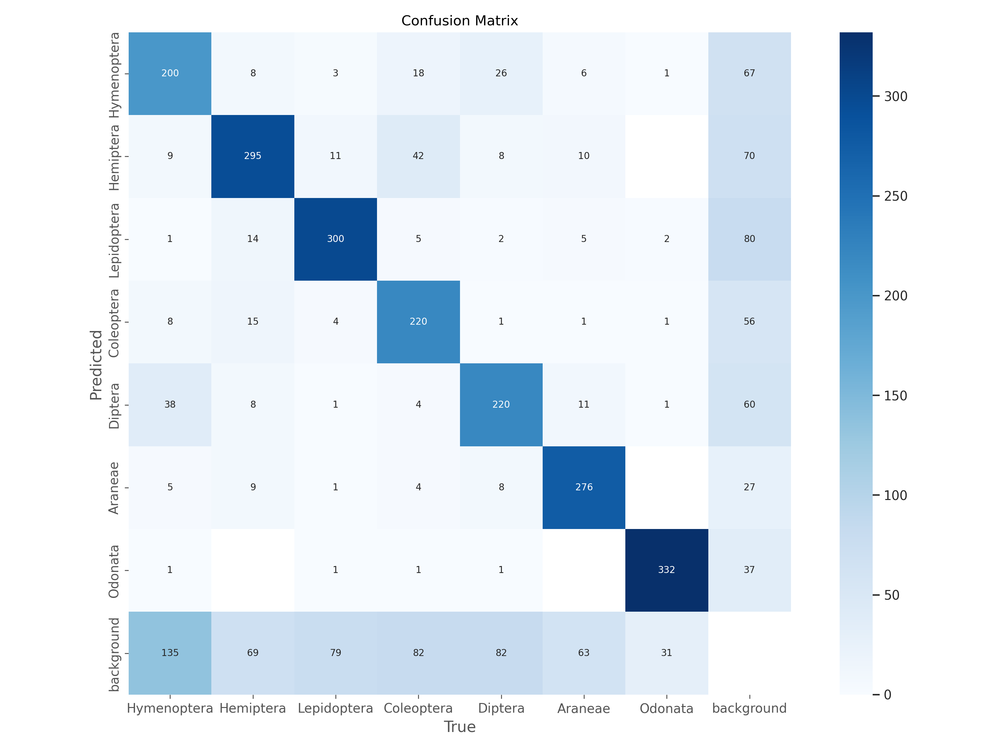

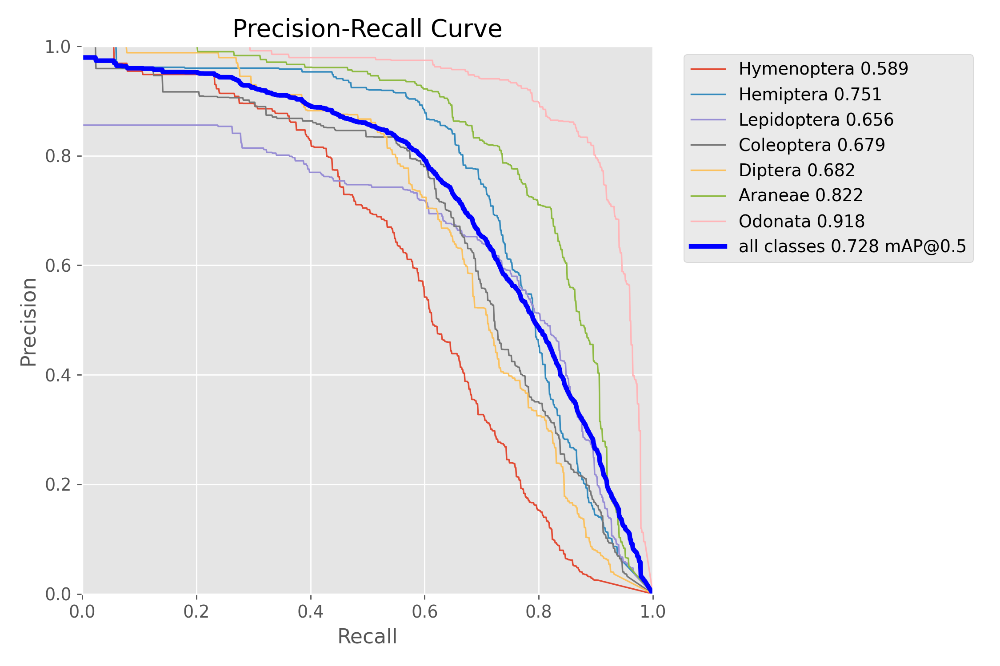

In [ ]:
from IPython.display import display, Image
from IPython.display import display, Image
import os

# Specify the path to the "runs" folder
runs_folder_path = "/content/drive/MyDrive/DLPROJECT/runswithval/detect/val"

# Display all JPG images in the "runs" folder
for filename in os.listdir(runs_folder_path):
    if filename.endswith(".png"):
        image_path = os.path.join(runs_folder_path, filename)
        display(Image(filename=image_path))


# STEP 6 - Test model on test data

In [ ]:
from ultralytics import YOLO

# Provide the path to the exported ONNX model
onnx_model_path = "/content/drive/MyDrive/DLPROJECT/runswithval/detect/train/weights/best.onnx"

# Load the model
model = YOLO(onnx_model_path)


In [ ]:
# Provide the path to your test image
test_image_path = "/content/drive/MyDrive/DLPROJECT/DL Small Set/IMG_20201205_092434.jpg"

# Run inference
results = model(test_image_path, save=True)

Loading /content/drive/MyDrive/DLPROJECT/runswithval/detect/train/weights/best.onnx for ONNX Runtime inference...
requirements: Ultralytics requirements ['onnx', 'onnxruntime'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 131.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 168.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 163.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 203.7 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 21.3s, installed 2 packages: ['onnx', 'onnxruntime']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


image 1/1 /content/drive/MyDrive/DLPROJECT/DL Small Set/IMG_20201205_092434.jpg: 640x640 1 Odonata, 1118.8ms
Speed: 77.7ms preprocess, 1118.8ms inference, 68.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


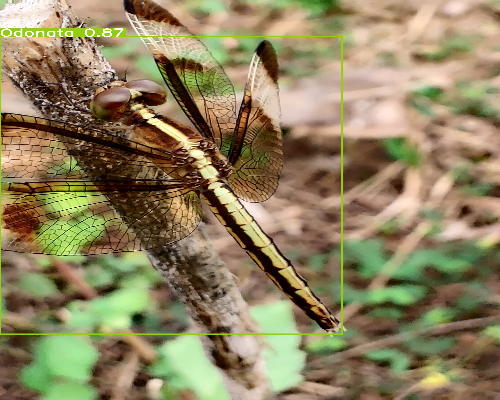

In [ ]:
from google.colab.patches import cv2_imshow
import cv2

# Specify the path to the annotated image
annotated_image_path = "/content/runs/detect/predict/IMG_20201205_092434.jpg"

# Load the image using OpenCV
image = cv2.imread(annotated_image_path)

# Resize the image
width = 500  # Specify the desired width
height = 400  # Specify the desired height
resized_image = cv2.resize(image, (width, height))

# Display the resized image using cv2_imshow
cv2_imshow(resized_image)

### Lets now try on all the test images

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/test"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)

Streaming output truncated to the last 5000 lines.

image 1/1 /content/drive/MyDrive/DLPROJECT/test/ad47fa92b46b.jpg: 640x640 1 Hymenoptera, 327.0ms
Speed: 4.7ms preprocess, 327.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/test/ec144853a577.jpg: 640x640 1 Coleoptera, 331.7ms
Speed: 4.7ms preprocess, 331.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/test/7f85745b715f.jpg: 640x640 1 Araneae, 319.6ms
Speed: 4.3ms preprocess, 319.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/test/86de3168088f.jpg: 640x640 1 Diptera, 433.1ms
Speed: 3.4ms preprocess, 433.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/test_output"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)

'import shutil\n\n# Specify the path to the results in Colab\nresults_path_colab = "/content/runs/detect/predict"\n\n# Specify the destination folder in your Google Drive\nresults_path_drive = "/content/drive/MyDrive/DLPROJECT/test_output"\n\n# Copy the results from Colab to Google Drive\nshutil.copytree(results_path_colab, results_path_drive)'

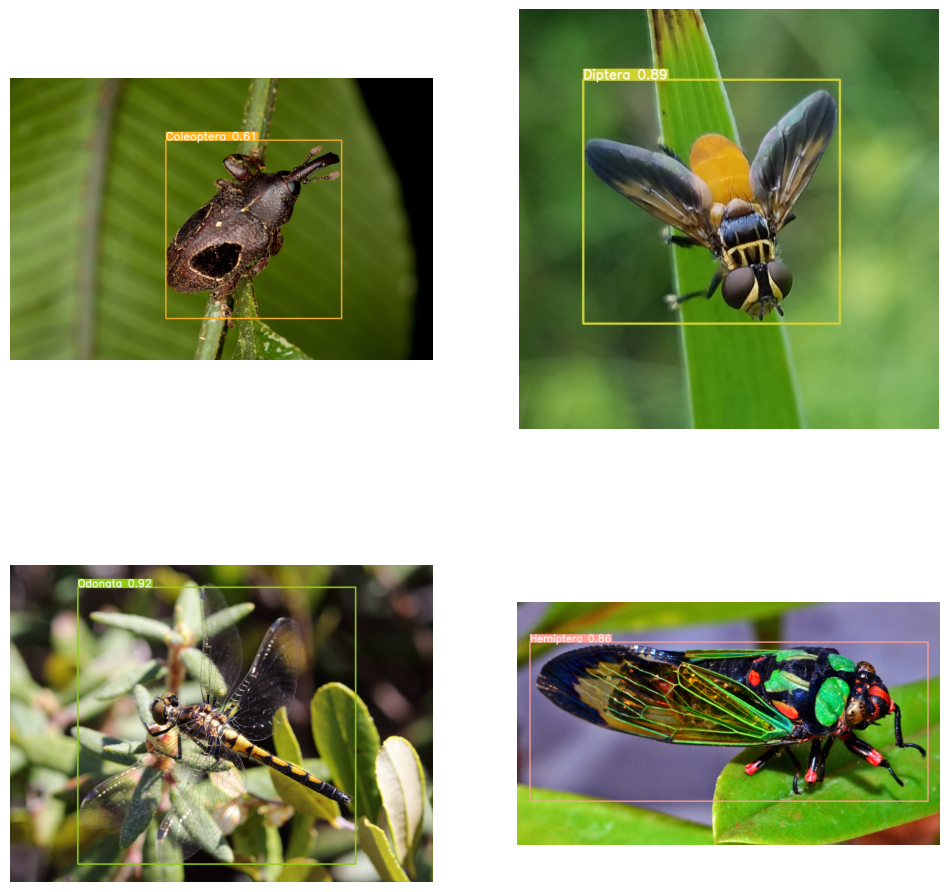

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/test_output"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()


# Step 7 -

**Now lets take some images from the Mobile corpus dataset and look at the predictions
We will test iamges foldernot wise, so that we can then look at the predcitions and guage if they are right or not.**

# Araneae

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Araneae"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)

Loading /content/drive/MyDrive/DLPROJECT/runswithval/detect/train/weights/best.onnx for ONNX Runtime inference...
requirements: Ultralytics requirements ['onnx', 'onnxruntime'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 214.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 136.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 170.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 203.3 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 11.8s, installed 2 packages: ['onnx', 'onnxruntime']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Araneae/IMG_20210215_082851.jpg: 640x640 1 Araneae, 403.4ms
Speed: 58.1ms preprocess, 403.4ms inference, 54.9ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJE

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/testAraneae"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)


'/content/drive/MyDrive/DLPROJECT/testAraneae'

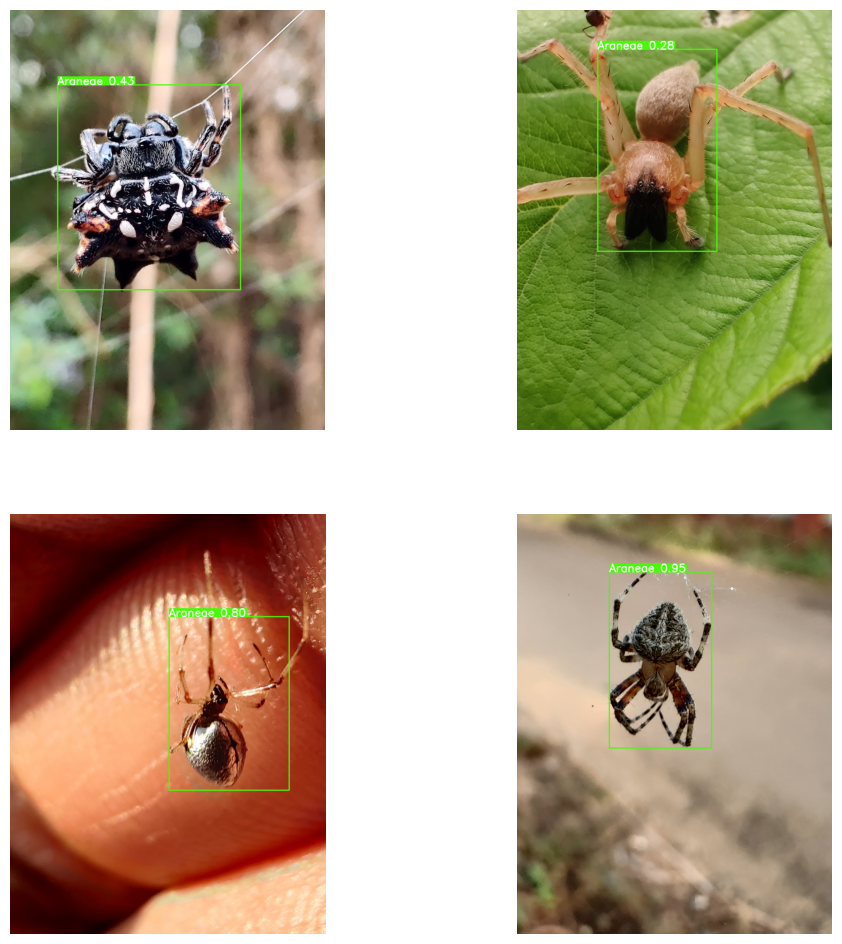

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/testAraneae"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()

**The above folder contains the Aranane category images and the predicted images mostly gives the same**

# Diptera

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Diptera"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)


image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Diptera/IMG_20210925_120111.jpg: 640x640 1 Hemiptera, 1 Diptera, 497.9ms
Speed: 5.0ms preprocess, 497.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Diptera/IMG_20210618_081941.jpg: 640x640 1 Diptera, 349.1ms
Speed: 3.9ms preprocess, 349.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Diptera/IMG_20210930_085224.jpg: 640x640 1 Diptera, 1 Odonata, 358.4ms
Speed: 5.7ms preprocess, 358.4ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Diptera/IMG_20211128_101927.jpg: 640x640 (no detections), 335.5ms
Speed: 4.2ms preprocess, 335.5ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)
Res

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/testDiptera"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)

'/content/drive/MyDrive/DLPROJECT/testDiptera'

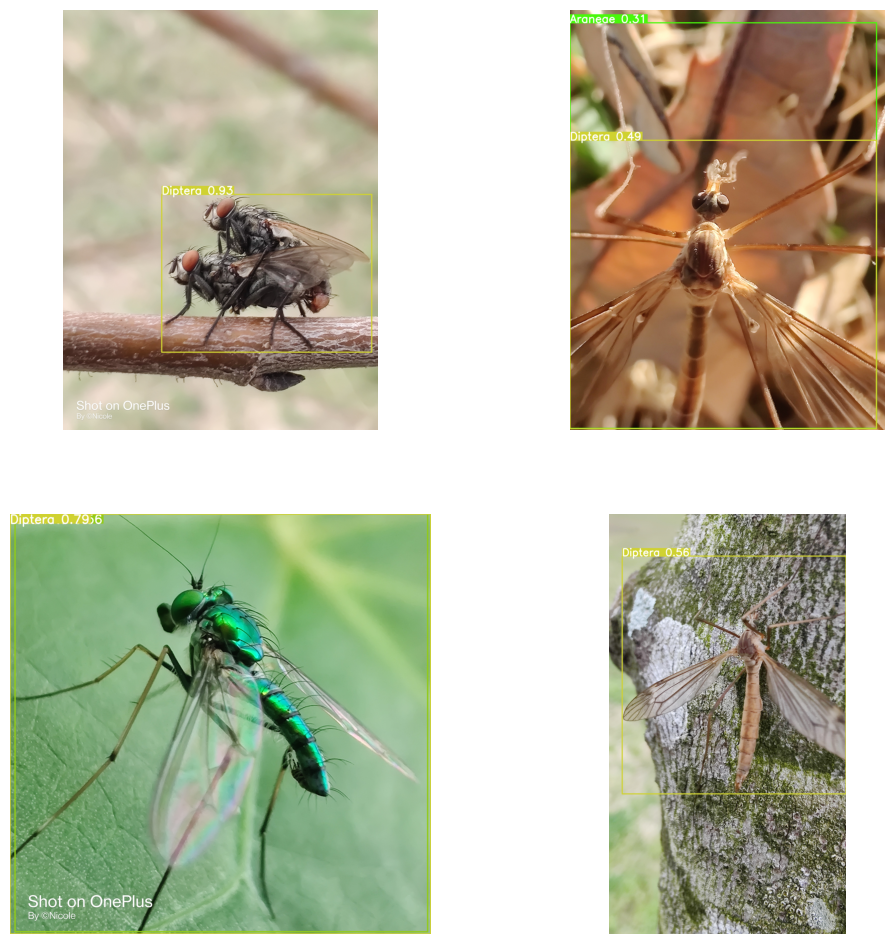

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/testDiptera"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()

# Lepidoptera

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Lepidoptera"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)


image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Lepidoptera/IMG_20210619_121147.jpg: 640x640 1 Lepidoptera, 693.3ms
Speed: 5.4ms preprocess, 693.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Lepidoptera/IMG_20210829_105659.jpg: 640x640 1 Lepidoptera, 631.4ms
Speed: 5.6ms preprocess, 631.4ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Lepidoptera/IMG_20201209_091347.jpg: 640x640 1 Hymenoptera, 1 Lepidoptera, 687.5ms
Speed: 5.0ms preprocess, 687.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Lepidoptera/IMG_20230624_160351.jpg: 640x640 2 Lepidopteras, 432.3ms
Speed: 3.9ms preprocess, 432.3ms inference, 1.0ms postprocess per image at shape (1

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/testLepidoptera"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)

'/content/drive/MyDrive/DLPROJECT/testLepidopteraa'

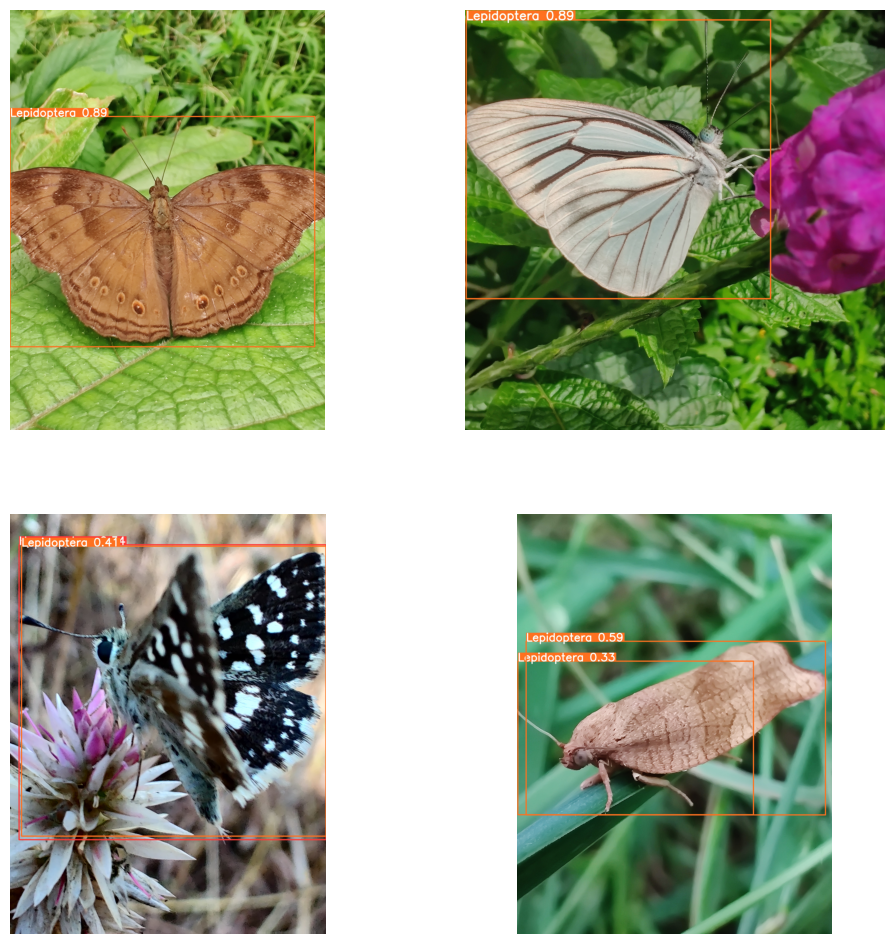

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/testLepidoptera"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()

# Odonata

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Odonata"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)


image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Odonata/IMG_20210828_103210__01_011451.jpg: 640x640 1 Odonata, 710.7ms
Speed: 4.6ms preprocess, 710.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Odonata/IMG_20200801_082554.jpg: 640x640 1 Odonata, 648.2ms
Speed: 4.1ms preprocess, 648.2ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Odonata/IMG_20210726_094200.jpg: 640x640 1 Odonata, 423.4ms
Speed: 3.9ms preprocess, 423.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive/DLPROJECT/DLSMALLSET2/Odonata/IMG_20210728_092256.jpg: 640x640 1 Odonata, 442.2ms
Speed: 4.0ms preprocess, 442.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/testOdonata"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)

'/content/drive/MyDrive/DLPROJECT/testOdonata'

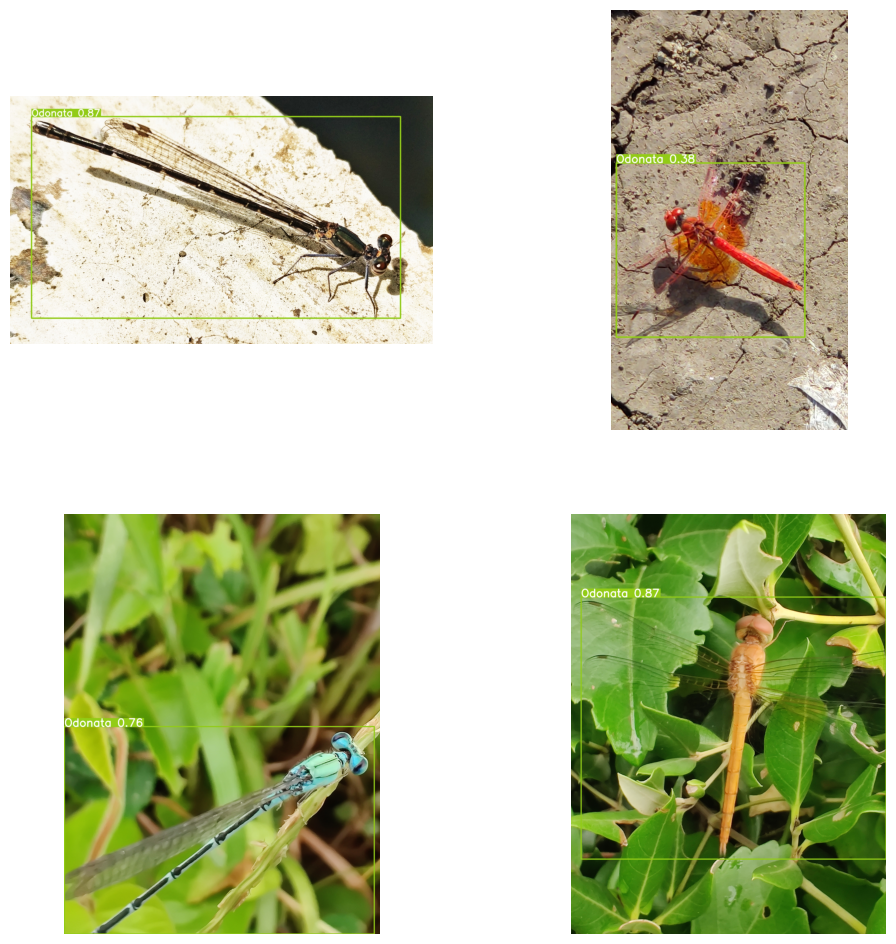

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/testOdonata"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()

# Multiple object detection

In [ ]:
import os

# Provide the path to the folder containing test images
test_images_folder = "/content/drive/MyDrive/DLPROJECT/MultipleObjectImages"

# Get a list of all image files in the folder
test_images = [os.path.join(test_images_folder, img) for img in os.listdir(test_images_folder) if img.endswith(".jpg")]

# Iterate through each test image
for test_image_path in test_images:
    # Run inference
    results = model(test_image_path, save=True)

Loading /content/drive/MyDrive/DLPROJECT/runswithval/detect/train/weights/best.onnx for ONNX Runtime inference...
requirements: Ultralytics requirements ['onnx', 'onnxruntime'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 267.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 344.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 238.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 279.1 MB/s eta 0:00:00

requirements: AutoUpdate success ✅ 13.9s, installed 2 packages: ['onnx', 'onnxruntime']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect


image 1/1 /content/drive/MyDrive/DLPROJECT/MultipleObjectImages/Screenshot_20211104-124742.jpg: 640x640 1 Araneae, 359.3ms
Speed: 55.1ms preprocess, 359.3ms inference, 59.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict

image 1/1 /content/drive/MyDrive

In [ ]:
import shutil

# Specify the path to the results in Colab
results_path_colab = "/content/runs/detect/predict"

# Specify the destination folder in your Google Drive
results_path_drive = "/content/drive/MyDrive/DLPROJECT/testMultipleObjectImages"

# Copy the results from Colab to Google Drive
shutil.copytree(results_path_colab, results_path_drive)

'/content/drive/MyDrive/DLPROJECT/testMultipleObjectImages'

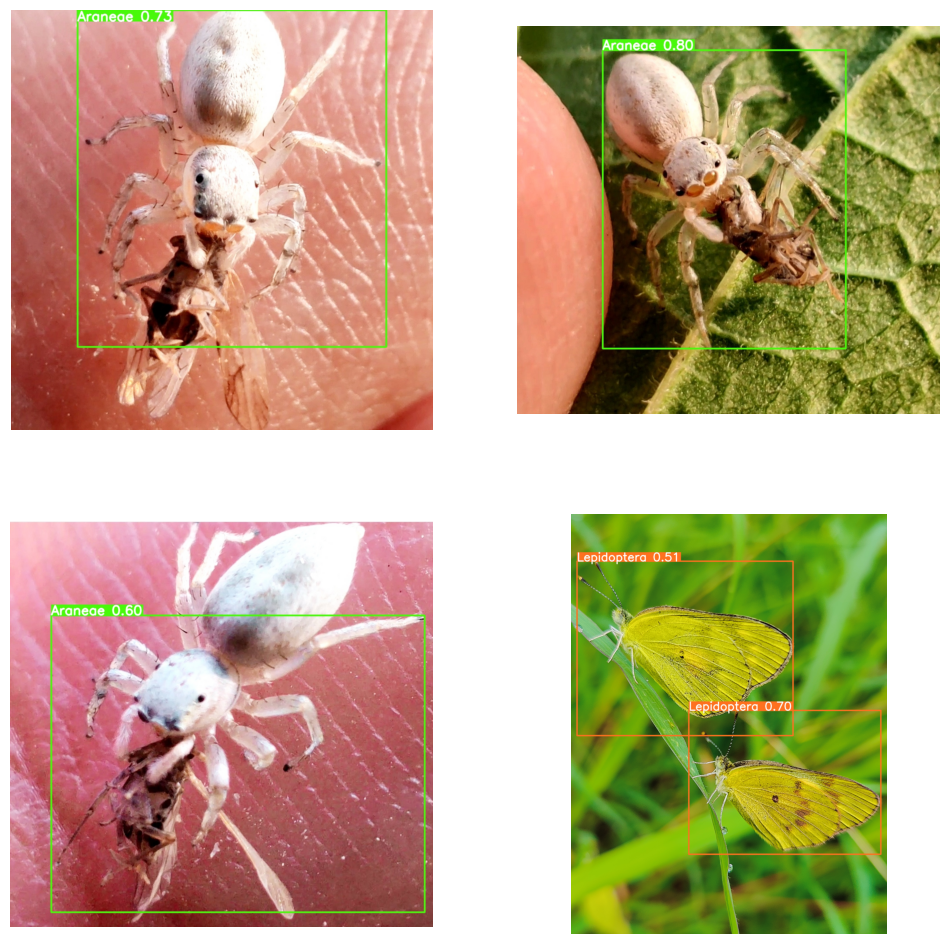

In [ ]:
# display those images now

import os
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Provide the path to the folder containing resultant images
result_images_folder = "/content/drive/MyDrive/DLPROJECT/testMultipleObjectImages"

# Get a list of all image files in the folder
result_images = [os.path.join(result_images_folder, img) for img in os.listdir(result_images_folder) if img.endswith(".jpg")]

# Select the first 9 images (adjust as needed)
sample_images = result_images[:4]

# Create a 3x3 grid for displaying the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

# Iterate through each selected image and display it on the grid
for i, ax in enumerate(axes.flatten()):
    # Read the image
    image = plt.imread(sample_images[i])

    # Display the image
    ax.imshow(image)
    ax.axis("off")

# Show the grid of images
plt.show()